In [1]:
!python --version

Python 3.10.18


In [2]:
import torch
torch.__version__

'2.8.0'

In [4]:
# Check for MPS availability and show the device
if hasattr(torch.backends, "mps") and torch.backends.mps.is_available():
	device = torch.device("mps:0")
	print("Using device:", device)
else:
	print("MPS is not available on this system.")

Using device: mps:0


In [5]:
import torch
from torch.utils.data import Dataset , DataLoader
from torchvision import transforms
from PIL import Image
import os

In [6]:
class CelebADataset(Dataset):
    def __init__(self, root_dir , transform = None ):
        self.root_dir = root_dir
        self.transform = transform
        
        self.image_paths = [os.path.join(root_dir, img ) for img in os.listdir(root_dir) if img.endswith('.jpg')]
        
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        
        if self.transform:
            image = self.transform(image)
            
        return image

In [7]:
transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5,0.5,0.5] , std=[0.5,0.5,0.5]) #Normalize in -1 to 1
])

dataset_path = '/Users/tajbirhasanshuvo/Downloads/img_align_celeba'
dataset = CelebADataset( root_dir=dataset_path , transform=transform)

dataloader = DataLoader(dataset , batch_size=128 , shuffle=True)

print(f"Total number of images loaded: {len(dataset)}")

Total number of images loaded: 202599


In [8]:
#Generator
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms
import matplotlib.pyplot as plt
import os
from PIL import Image
import torchvision
import numpy as np

In [9]:
class Generator(nn.Module):
    def __init__(self, z_dim=100 , img_channels = 3 ):
        super(Generator , self).__init__()
        self.model = nn.Sequential(
            nn.Linear(z_dim,256),
            nn.ReLU(True),
            nn.Linear(256,512),
            nn.ReLU(True),
            nn.Linear(512, 1024),
            nn.ReLU(True),
            nn.Linear(1024, img_channels*64*64),
            nn.Tanh()
        )
    
    def forward(self , z):
        img = self.model(z)
        img = img.view(img.size(0), 3,64,64)
        return img

In [10]:
class Discriminator(nn.Module):
    def __init__(self, img_channels=3 ):
        super(Discriminator , self).__init__()
        self.model = nn.Sequential(
            nn.Flatten(),
            nn.Linear(img_channels*64*64 , 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024 , 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear( 512 , 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )
    
    def forward(self, img):
        return self.model(img)

In [13]:
adversarial_loss = nn.BCELoss()

generator = Generator(z_dim=100)
discriminator = Discriminator()

optimizer_G = optim.Adam(generator.parameters(), lr=0.0002 , betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002 , betas=(0.5, 0.999))

device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')

generator = generator.to(device)
discriminator= discriminator.to(device)

In [16]:
# Training loop
def train(generator, discriminator, dataloader, epochs=5):
    for epoch in range(epochs):
        for i, imgs in enumerate(dataloader):
            real_imgs = imgs.to(device)
            batch_size = real_imgs.size(0)
            valid = torch.ones(batch_size, 1).to(device)
            fake = torch.zeros(batch_size, 1).to(device)

            # Train Discriminator
            optimizer_D.zero_grad()
            real_loss = adversarial_loss(discriminator(real_imgs), valid)
            fake_loss = adversarial_loss(discriminator(generator(torch.randn(batch_size, 100).to(device)).detach()), fake)
            d_loss = (real_loss + fake_loss) / 2
            d_loss.backward()
            optimizer_D.step()

            # Train Generator
            optimizer_G.zero_grad()
            g_loss = adversarial_loss(discriminator(generator(torch.randn(batch_size, 100).to(device))), valid)
            g_loss.backward()
            optimizer_G.step()

            if i % 50 == 0:
                print(f"[Epoch {epoch}/{epochs}] [Batch {i}/{len(dataloader)}] [D loss: {d_loss.item()}] [G loss: {g_loss.item()}]")

        # Optionally, save generated images at each epoch
        save_generated_images(generator, epoch, device)

In [17]:
def save_generated_images(generator, epoch, device, num_images=16):
    z = torch.randn(num_images, 100).to(device)
    generated_imgs = generator(z).detach().cpu()
    grid = torchvision.utils.make_grid(generated_imgs, nrow=4, normalize=True)
    plt.imshow(np.transpose(grid, (1, 2, 0)))
    plt.title(f"Epoch {epoch}")
    plt.axis('off')
    plt.show()

[Epoch 0/25] [Batch 0/1583] [D loss: 0.6196708679199219] [G loss: 1.0773394107818604]
[Epoch 0/25] [Batch 50/1583] [D loss: 0.5539063215255737] [G loss: 1.0478312969207764]
[Epoch 0/25] [Batch 100/1583] [D loss: 0.5330058336257935] [G loss: 1.149841547012329]
[Epoch 0/25] [Batch 150/1583] [D loss: 0.5879008173942566] [G loss: 1.3871972560882568]
[Epoch 0/25] [Batch 200/1583] [D loss: 0.6159637570381165] [G loss: 1.1030594110488892]
[Epoch 0/25] [Batch 250/1583] [D loss: 0.5801556706428528] [G loss: 1.1356415748596191]
[Epoch 0/25] [Batch 300/1583] [D loss: 0.6158114075660706] [G loss: 1.049546480178833]
[Epoch 0/25] [Batch 350/1583] [D loss: 0.6358669996261597] [G loss: 1.3152189254760742]
[Epoch 0/25] [Batch 400/1583] [D loss: 0.5634689331054688] [G loss: 1.0602691173553467]
[Epoch 0/25] [Batch 450/1583] [D loss: 0.6004177331924438] [G loss: 1.0766823291778564]
[Epoch 0/25] [Batch 500/1583] [D loss: 0.6132944226264954] [G loss: 1.0928144454956055]
[Epoch 0/25] [Batch 550/1583] [D loss

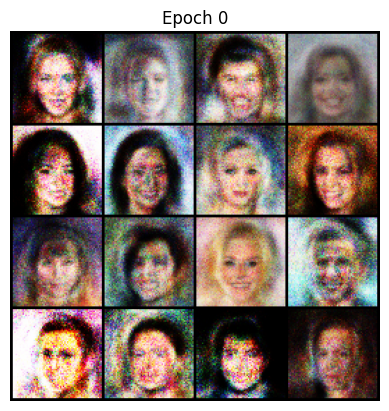

[Epoch 1/25] [Batch 0/1583] [D loss: 0.5856363773345947] [G loss: 1.0146682262420654]
[Epoch 1/25] [Batch 50/1583] [D loss: 0.6207388639450073] [G loss: 1.0678894519805908]
[Epoch 1/25] [Batch 100/1583] [D loss: 0.577262282371521] [G loss: 1.1240023374557495]
[Epoch 1/25] [Batch 150/1583] [D loss: 0.5995578169822693] [G loss: 1.1042660474777222]
[Epoch 1/25] [Batch 200/1583] [D loss: 0.6026576161384583] [G loss: 1.2512717247009277]
[Epoch 1/25] [Batch 250/1583] [D loss: 0.5242602825164795] [G loss: 1.1839854717254639]
[Epoch 1/25] [Batch 300/1583] [D loss: 0.5963816046714783] [G loss: 1.0869468450546265]
[Epoch 1/25] [Batch 350/1583] [D loss: 0.6240643262863159] [G loss: 1.0532360076904297]
[Epoch 1/25] [Batch 400/1583] [D loss: 0.5339173078536987] [G loss: 1.1472876071929932]
[Epoch 1/25] [Batch 450/1583] [D loss: 0.727059543132782] [G loss: 0.9669632911682129]
[Epoch 1/25] [Batch 500/1583] [D loss: 0.6186328530311584] [G loss: 1.0815247297286987]
[Epoch 1/25] [Batch 550/1583] [D loss

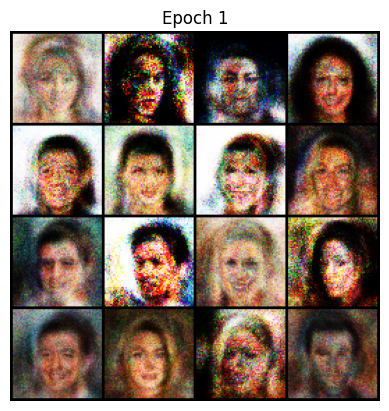

[Epoch 2/25] [Batch 0/1583] [D loss: 0.5694576501846313] [G loss: 1.0183225870132446]
[Epoch 2/25] [Batch 50/1583] [D loss: 0.5165672302246094] [G loss: 1.094139814376831]
[Epoch 2/25] [Batch 100/1583] [D loss: 0.5728057622909546] [G loss: 1.342745065689087]
[Epoch 2/25] [Batch 150/1583] [D loss: 0.5699350833892822] [G loss: 1.1345183849334717]
[Epoch 2/25] [Batch 200/1583] [D loss: 0.5919331312179565] [G loss: 1.1009491682052612]
[Epoch 2/25] [Batch 250/1583] [D loss: 0.5834636688232422] [G loss: 0.9892998933792114]
[Epoch 2/25] [Batch 300/1583] [D loss: 0.5728726387023926] [G loss: 1.0660133361816406]
[Epoch 2/25] [Batch 350/1583] [D loss: 0.5812423229217529] [G loss: 1.0966625213623047]
[Epoch 2/25] [Batch 400/1583] [D loss: 0.5754342079162598] [G loss: 1.0732264518737793]
[Epoch 2/25] [Batch 450/1583] [D loss: 0.6517006158828735] [G loss: 1.2083525657653809]
[Epoch 2/25] [Batch 500/1583] [D loss: 0.6101065874099731] [G loss: 1.0853354930877686]
[Epoch 2/25] [Batch 550/1583] [D loss

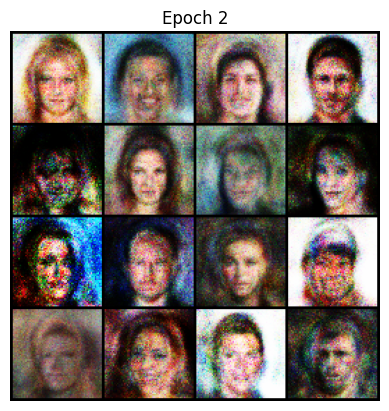

[Epoch 3/25] [Batch 0/1583] [D loss: 0.6104596853256226] [G loss: 1.031607985496521]
[Epoch 3/25] [Batch 50/1583] [D loss: 0.5576847791671753] [G loss: 0.9367103576660156]
[Epoch 3/25] [Batch 100/1583] [D loss: 0.6299660801887512] [G loss: 0.9792656898498535]
[Epoch 3/25] [Batch 150/1583] [D loss: 0.5772689580917358] [G loss: 1.2213091850280762]
[Epoch 3/25] [Batch 200/1583] [D loss: 0.5839313268661499] [G loss: 1.0624772310256958]
[Epoch 3/25] [Batch 250/1583] [D loss: 0.6312693953514099] [G loss: 0.9758442640304565]
[Epoch 3/25] [Batch 300/1583] [D loss: 0.6072371602058411] [G loss: 1.137385606765747]
[Epoch 3/25] [Batch 350/1583] [D loss: 0.554520845413208] [G loss: 1.0366191864013672]
[Epoch 3/25] [Batch 400/1583] [D loss: 0.5915281772613525] [G loss: 0.9616664052009583]
[Epoch 3/25] [Batch 450/1583] [D loss: 0.6116700172424316] [G loss: 0.9859530925750732]
[Epoch 3/25] [Batch 500/1583] [D loss: 0.6141746044158936] [G loss: 1.1815259456634521]
[Epoch 3/25] [Batch 550/1583] [D loss:

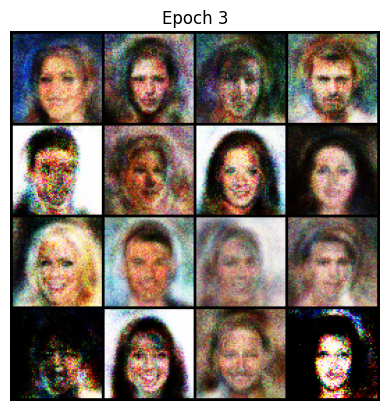

[Epoch 4/25] [Batch 0/1583] [D loss: 0.5801516771316528] [G loss: 1.0421552658081055]
[Epoch 4/25] [Batch 50/1583] [D loss: 0.5865422487258911] [G loss: 0.9335538148880005]
[Epoch 4/25] [Batch 100/1583] [D loss: 0.6092896461486816] [G loss: 1.110718846321106]
[Epoch 4/25] [Batch 150/1583] [D loss: 0.6325202584266663] [G loss: 1.0660159587860107]
[Epoch 4/25] [Batch 200/1583] [D loss: 0.6041348576545715] [G loss: 1.1596077680587769]
[Epoch 4/25] [Batch 250/1583] [D loss: 0.5820797681808472] [G loss: 0.973714292049408]
[Epoch 4/25] [Batch 300/1583] [D loss: 0.5927478075027466] [G loss: 0.9457839131355286]
[Epoch 4/25] [Batch 350/1583] [D loss: 0.6100996732711792] [G loss: 1.1300128698349]
[Epoch 4/25] [Batch 400/1583] [D loss: 0.62001633644104] [G loss: 1.051707148551941]
[Epoch 4/25] [Batch 450/1583] [D loss: 0.6124233603477478] [G loss: 1.208858609199524]
[Epoch 4/25] [Batch 500/1583] [D loss: 0.6151166558265686] [G loss: 0.9286379814147949]
[Epoch 4/25] [Batch 550/1583] [D loss: 0.637

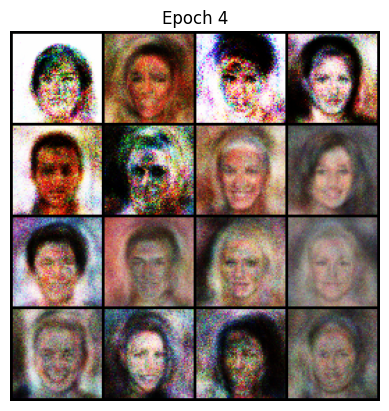

[Epoch 5/25] [Batch 0/1583] [D loss: 0.6114587187767029] [G loss: 0.9827193021774292]
[Epoch 5/25] [Batch 50/1583] [D loss: 0.5733430981636047] [G loss: 1.0459107160568237]
[Epoch 5/25] [Batch 100/1583] [D loss: 0.6174036860466003] [G loss: 1.0608686208724976]
[Epoch 5/25] [Batch 150/1583] [D loss: 0.6163343787193298] [G loss: 1.0272154808044434]
[Epoch 5/25] [Batch 200/1583] [D loss: 0.5859136581420898] [G loss: 1.1957333087921143]
[Epoch 5/25] [Batch 250/1583] [D loss: 0.6063194870948792] [G loss: 1.1395331621170044]
[Epoch 5/25] [Batch 300/1583] [D loss: 0.5635426640510559] [G loss: 1.0993037223815918]
[Epoch 5/25] [Batch 350/1583] [D loss: 0.5830925703048706] [G loss: 1.0654571056365967]
[Epoch 5/25] [Batch 400/1583] [D loss: 0.5901740789413452] [G loss: 1.0338244438171387]
[Epoch 5/25] [Batch 450/1583] [D loss: 0.5888850092887878] [G loss: 1.0884438753128052]
[Epoch 5/25] [Batch 500/1583] [D loss: 0.5749208331108093] [G loss: 1.0510518550872803]
[Epoch 5/25] [Batch 550/1583] [D lo

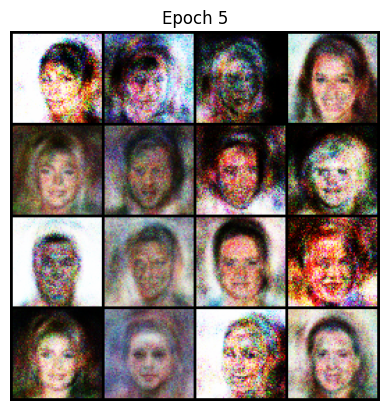

[Epoch 6/25] [Batch 0/1583] [D loss: 0.6694514751434326] [G loss: 1.080034852027893]
[Epoch 6/25] [Batch 50/1583] [D loss: 0.5698463916778564] [G loss: 1.0617797374725342]
[Epoch 6/25] [Batch 100/1583] [D loss: 0.5755797624588013] [G loss: 1.044398546218872]
[Epoch 6/25] [Batch 150/1583] [D loss: 0.5934730172157288] [G loss: 1.000870943069458]
[Epoch 6/25] [Batch 200/1583] [D loss: 0.667209267616272] [G loss: 0.9734087586402893]
[Epoch 6/25] [Batch 250/1583] [D loss: 0.5433557033538818] [G loss: 1.097907304763794]
[Epoch 6/25] [Batch 300/1583] [D loss: 0.5864945650100708] [G loss: 1.0105600357055664]
[Epoch 6/25] [Batch 350/1583] [D loss: 0.5592302680015564] [G loss: 0.8855602741241455]
[Epoch 6/25] [Batch 400/1583] [D loss: 0.5886038541793823] [G loss: 1.083425521850586]
[Epoch 6/25] [Batch 450/1583] [D loss: 0.56013023853302] [G loss: 1.1316356658935547]
[Epoch 6/25] [Batch 500/1583] [D loss: 0.6161202192306519] [G loss: 0.9829261302947998]
[Epoch 6/25] [Batch 550/1583] [D loss: 0.59

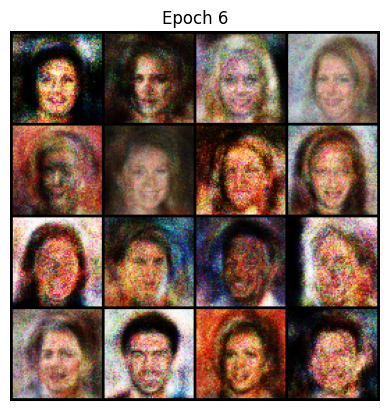

[Epoch 7/25] [Batch 0/1583] [D loss: 0.556154191493988] [G loss: 1.2116312980651855]
[Epoch 7/25] [Batch 50/1583] [D loss: 0.5373175144195557] [G loss: 1.083709478378296]
[Epoch 7/25] [Batch 100/1583] [D loss: 0.6240144968032837] [G loss: 1.0130670070648193]
[Epoch 7/25] [Batch 150/1583] [D loss: 0.5722149014472961] [G loss: 0.9994791150093079]
[Epoch 7/25] [Batch 200/1583] [D loss: 0.6101102828979492] [G loss: 1.0844275951385498]
[Epoch 7/25] [Batch 250/1583] [D loss: 0.5786139369010925] [G loss: 0.93369460105896]
[Epoch 7/25] [Batch 300/1583] [D loss: 0.6336191892623901] [G loss: 1.1206196546554565]
[Epoch 7/25] [Batch 350/1583] [D loss: 0.6061049699783325] [G loss: 1.022078514099121]
[Epoch 7/25] [Batch 400/1583] [D loss: 0.5681039094924927] [G loss: 0.9606790542602539]
[Epoch 7/25] [Batch 450/1583] [D loss: 0.5981925129890442] [G loss: 1.0129220485687256]
[Epoch 7/25] [Batch 500/1583] [D loss: 0.5937545299530029] [G loss: 1.0603392124176025]
[Epoch 7/25] [Batch 550/1583] [D loss: 0

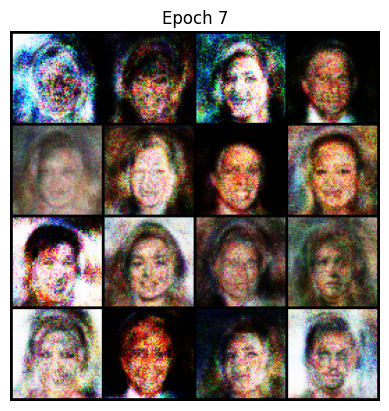

[Epoch 8/25] [Batch 0/1583] [D loss: 0.5529278516769409] [G loss: 0.9676432609558105]
[Epoch 8/25] [Batch 50/1583] [D loss: 0.5932002067565918] [G loss: 0.9595767259597778]
[Epoch 8/25] [Batch 100/1583] [D loss: 0.584275484085083] [G loss: 1.0910159349441528]
[Epoch 8/25] [Batch 150/1583] [D loss: 0.5785443186759949] [G loss: 1.0807852745056152]
[Epoch 8/25] [Batch 200/1583] [D loss: 0.6135981678962708] [G loss: 0.9984421730041504]
[Epoch 8/25] [Batch 250/1583] [D loss: 0.6184341311454773] [G loss: 1.0436115264892578]
[Epoch 8/25] [Batch 300/1583] [D loss: 0.5897265076637268] [G loss: 1.082636833190918]
[Epoch 8/25] [Batch 350/1583] [D loss: 0.6326419711112976] [G loss: 1.0755820274353027]
[Epoch 8/25] [Batch 400/1583] [D loss: 0.6099319458007812] [G loss: 1.070591926574707]
[Epoch 8/25] [Batch 450/1583] [D loss: 0.627126932144165] [G loss: 0.9306544661521912]
[Epoch 8/25] [Batch 500/1583] [D loss: 0.574555516242981] [G loss: 1.1087979078292847]
[Epoch 8/25] [Batch 550/1583] [D loss: 0

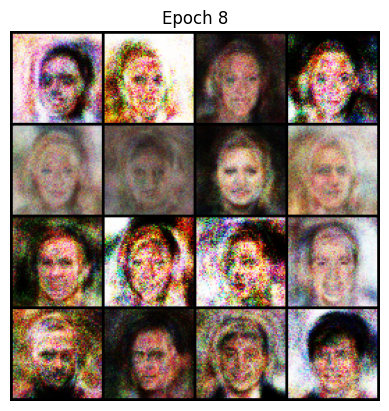

[Epoch 9/25] [Batch 0/1583] [D loss: 0.6277016401290894] [G loss: 1.1136486530303955]
[Epoch 9/25] [Batch 50/1583] [D loss: 0.5762472152709961] [G loss: 1.057234764099121]
[Epoch 9/25] [Batch 100/1583] [D loss: 0.6021514534950256] [G loss: 1.070764183998108]
[Epoch 9/25] [Batch 150/1583] [D loss: 0.553425669670105] [G loss: 1.094501256942749]
[Epoch 9/25] [Batch 200/1583] [D loss: 0.608617901802063] [G loss: 0.9534788131713867]
[Epoch 9/25] [Batch 250/1583] [D loss: 0.5871205925941467] [G loss: 0.9592316746711731]
[Epoch 9/25] [Batch 300/1583] [D loss: 0.6642526388168335] [G loss: 1.0449464321136475]
[Epoch 9/25] [Batch 350/1583] [D loss: 0.6163982152938843] [G loss: 0.9952108263969421]
[Epoch 9/25] [Batch 400/1583] [D loss: 0.5387087464332581] [G loss: 1.1166353225708008]
[Epoch 9/25] [Batch 450/1583] [D loss: 0.6035026907920837] [G loss: 1.0778460502624512]
[Epoch 9/25] [Batch 500/1583] [D loss: 0.5734177231788635] [G loss: 1.019249439239502]
[Epoch 9/25] [Batch 550/1583] [D loss: 0.

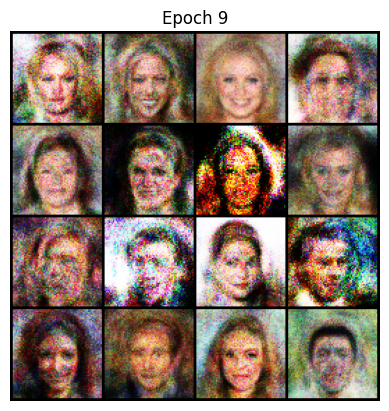

[Epoch 10/25] [Batch 0/1583] [D loss: 0.6122572422027588] [G loss: 1.0443581342697144]
[Epoch 10/25] [Batch 50/1583] [D loss: 0.610319972038269] [G loss: 1.0547614097595215]
[Epoch 10/25] [Batch 100/1583] [D loss: 0.563541054725647] [G loss: 1.1081410646438599]
[Epoch 10/25] [Batch 150/1583] [D loss: 0.560934841632843] [G loss: 1.0046014785766602]
[Epoch 10/25] [Batch 200/1583] [D loss: 0.5786824822425842] [G loss: 0.9736661314964294]
[Epoch 10/25] [Batch 250/1583] [D loss: 0.5676512718200684] [G loss: 1.0326968431472778]
[Epoch 10/25] [Batch 300/1583] [D loss: 0.6050076484680176] [G loss: 0.9854695200920105]
[Epoch 10/25] [Batch 350/1583] [D loss: 0.6493216753005981] [G loss: 0.9898935556411743]
[Epoch 10/25] [Batch 400/1583] [D loss: 0.5941054224967957] [G loss: 1.0600723028182983]
[Epoch 10/25] [Batch 450/1583] [D loss: 0.6023532152175903] [G loss: 1.060866355895996]
[Epoch 10/25] [Batch 500/1583] [D loss: 0.6096491813659668] [G loss: 1.1479299068450928]
[Epoch 10/25] [Batch 550/158

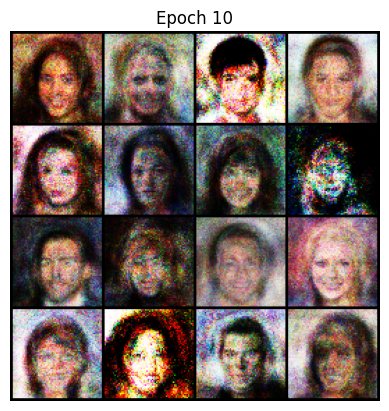

[Epoch 11/25] [Batch 0/1583] [D loss: 0.6374941468238831] [G loss: 0.9903971552848816]
[Epoch 11/25] [Batch 50/1583] [D loss: 0.5682833790779114] [G loss: 1.137121558189392]
[Epoch 11/25] [Batch 100/1583] [D loss: 0.6042723655700684] [G loss: 0.9823809862136841]
[Epoch 11/25] [Batch 150/1583] [D loss: 0.5944201946258545] [G loss: 0.9897137880325317]
[Epoch 11/25] [Batch 200/1583] [D loss: 0.5950838327407837] [G loss: 1.020566463470459]
[Epoch 11/25] [Batch 250/1583] [D loss: 0.5822346210479736] [G loss: 1.035658359527588]
[Epoch 11/25] [Batch 300/1583] [D loss: 0.6010932922363281] [G loss: 1.0673609972000122]
[Epoch 11/25] [Batch 350/1583] [D loss: 0.6103544235229492] [G loss: 1.0162971019744873]
[Epoch 11/25] [Batch 400/1583] [D loss: 0.6120375394821167] [G loss: 1.1485786437988281]
[Epoch 11/25] [Batch 450/1583] [D loss: 0.5891920328140259] [G loss: 1.0464105606079102]
[Epoch 11/25] [Batch 500/1583] [D loss: 0.562026858329773] [G loss: 1.0991849899291992]
[Epoch 11/25] [Batch 550/158

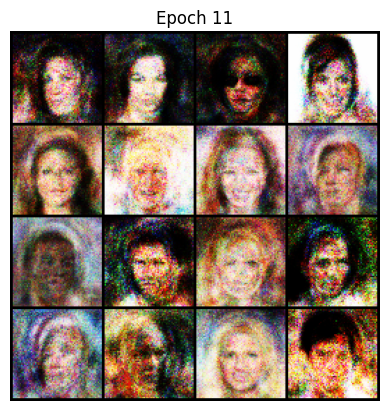

[Epoch 12/25] [Batch 0/1583] [D loss: 0.608692467212677] [G loss: 1.1402931213378906]
[Epoch 12/25] [Batch 50/1583] [D loss: 0.6159197092056274] [G loss: 0.9500793814659119]
[Epoch 12/25] [Batch 100/1583] [D loss: 0.6336897611618042] [G loss: 1.1693365573883057]
[Epoch 12/25] [Batch 150/1583] [D loss: 0.6275349855422974] [G loss: 0.9805344343185425]
[Epoch 12/25] [Batch 200/1583] [D loss: 0.5725231170654297] [G loss: 0.9446353912353516]
[Epoch 12/25] [Batch 250/1583] [D loss: 0.5970995426177979] [G loss: 1.0317590236663818]
[Epoch 12/25] [Batch 300/1583] [D loss: 0.5892865657806396] [G loss: 1.1199517250061035]
[Epoch 12/25] [Batch 350/1583] [D loss: 0.5834475755691528] [G loss: 0.9675655364990234]
[Epoch 12/25] [Batch 400/1583] [D loss: 0.5990892648696899] [G loss: 1.0413875579833984]
[Epoch 12/25] [Batch 450/1583] [D loss: 0.6105132102966309] [G loss: 1.170562505722046]
[Epoch 12/25] [Batch 500/1583] [D loss: 0.5906664133071899] [G loss: 1.1989729404449463]
[Epoch 12/25] [Batch 550/1

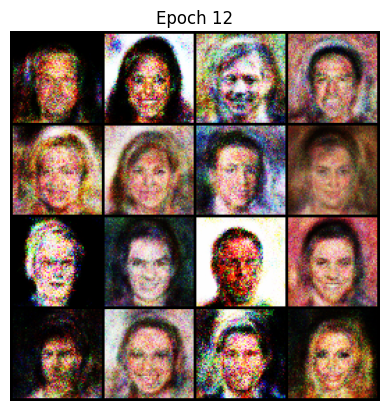

[Epoch 13/25] [Batch 0/1583] [D loss: 0.6008932590484619] [G loss: 1.0802686214447021]
[Epoch 13/25] [Batch 50/1583] [D loss: 0.6120994091033936] [G loss: 1.0477943420410156]
[Epoch 13/25] [Batch 100/1583] [D loss: 0.5833202600479126] [G loss: 1.109100580215454]
[Epoch 13/25] [Batch 150/1583] [D loss: 0.6404811143875122] [G loss: 1.0793125629425049]
[Epoch 13/25] [Batch 200/1583] [D loss: 0.5649710893630981] [G loss: 1.1681376695632935]
[Epoch 13/25] [Batch 250/1583] [D loss: 0.5785319805145264] [G loss: 1.1046932935714722]
[Epoch 13/25] [Batch 300/1583] [D loss: 0.6373001337051392] [G loss: 1.012512445449829]
[Epoch 13/25] [Batch 350/1583] [D loss: 0.609136700630188] [G loss: 1.0176277160644531]
[Epoch 13/25] [Batch 400/1583] [D loss: 0.5794689655303955] [G loss: 1.0783789157867432]
[Epoch 13/25] [Batch 450/1583] [D loss: 0.5985239148139954] [G loss: 1.060805082321167]
[Epoch 13/25] [Batch 500/1583] [D loss: 0.6058269739151001] [G loss: 1.0982286930084229]
[Epoch 13/25] [Batch 550/158

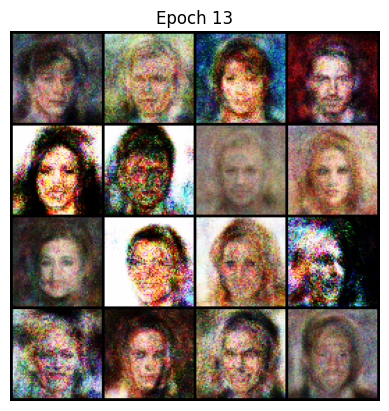

[Epoch 14/25] [Batch 0/1583] [D loss: 0.618681013584137] [G loss: 0.9594348073005676]
[Epoch 14/25] [Batch 50/1583] [D loss: 0.6214858293533325] [G loss: 0.9304311871528625]
[Epoch 14/25] [Batch 100/1583] [D loss: 0.5975267887115479] [G loss: 1.0644447803497314]
[Epoch 14/25] [Batch 150/1583] [D loss: 0.5583807229995728] [G loss: 1.178889513015747]
[Epoch 14/25] [Batch 200/1583] [D loss: 0.641862690448761] [G loss: 1.0059640407562256]
[Epoch 14/25] [Batch 250/1583] [D loss: 0.5421464443206787] [G loss: 0.9286513924598694]
[Epoch 14/25] [Batch 300/1583] [D loss: 0.6202445030212402] [G loss: 1.0907970666885376]
[Epoch 14/25] [Batch 350/1583] [D loss: 0.5482021570205688] [G loss: 1.0693845748901367]
[Epoch 14/25] [Batch 400/1583] [D loss: 0.5910302400588989] [G loss: 0.9661556482315063]
[Epoch 14/25] [Batch 450/1583] [D loss: 0.6187342405319214] [G loss: 1.1364940404891968]
[Epoch 14/25] [Batch 500/1583] [D loss: 0.5940524339675903] [G loss: 0.985318124294281]
[Epoch 14/25] [Batch 550/158

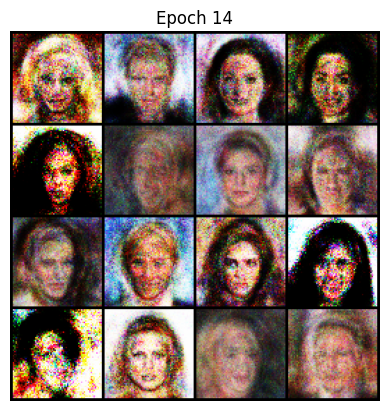

[Epoch 15/25] [Batch 0/1583] [D loss: 0.5708703994750977] [G loss: 1.0378241539001465]
[Epoch 15/25] [Batch 50/1583] [D loss: 0.5524357557296753] [G loss: 1.0864040851593018]
[Epoch 15/25] [Batch 100/1583] [D loss: 0.5424036979675293] [G loss: 1.1579537391662598]
[Epoch 15/25] [Batch 150/1583] [D loss: 0.6052083373069763] [G loss: 1.1401013135910034]
[Epoch 15/25] [Batch 200/1583] [D loss: 0.6163511276245117] [G loss: 1.0051097869873047]
[Epoch 15/25] [Batch 250/1583] [D loss: 0.5883374214172363] [G loss: 1.1984796524047852]
[Epoch 15/25] [Batch 300/1583] [D loss: 0.5800342559814453] [G loss: 1.0169925689697266]
[Epoch 15/25] [Batch 350/1583] [D loss: 0.603945791721344] [G loss: 1.0441803932189941]
[Epoch 15/25] [Batch 400/1583] [D loss: 0.544859766960144] [G loss: 0.926215410232544]
[Epoch 15/25] [Batch 450/1583] [D loss: 0.5831775069236755] [G loss: 1.0410339832305908]
[Epoch 15/25] [Batch 500/1583] [D loss: 0.5541189312934875] [G loss: 0.9920763969421387]
[Epoch 15/25] [Batch 550/15

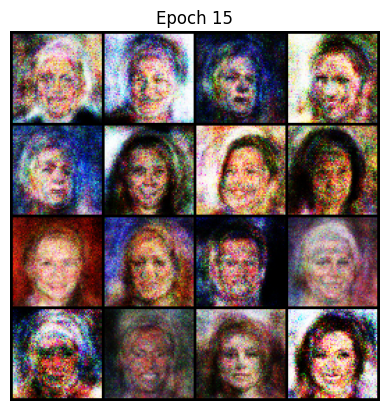

[Epoch 16/25] [Batch 0/1583] [D loss: 0.5638207197189331] [G loss: 1.0880804061889648]
[Epoch 16/25] [Batch 50/1583] [D loss: 0.5812849998474121] [G loss: 1.0420424938201904]
[Epoch 16/25] [Batch 100/1583] [D loss: 0.6263754963874817] [G loss: 1.0113918781280518]
[Epoch 16/25] [Batch 150/1583] [D loss: 0.5556797385215759] [G loss: 1.1725436449050903]
[Epoch 16/25] [Batch 200/1583] [D loss: 0.6168973445892334] [G loss: 0.9799723029136658]
[Epoch 16/25] [Batch 250/1583] [D loss: 0.6050306558609009] [G loss: 1.04756760597229]
[Epoch 16/25] [Batch 300/1583] [D loss: 0.6218838691711426] [G loss: 1.116701602935791]
[Epoch 16/25] [Batch 350/1583] [D loss: 0.5838077664375305] [G loss: 1.0166245698928833]
[Epoch 16/25] [Batch 400/1583] [D loss: 0.5690344572067261] [G loss: 1.0193898677825928]
[Epoch 16/25] [Batch 450/1583] [D loss: 0.578587532043457] [G loss: 1.2942124605178833]
[Epoch 16/25] [Batch 500/1583] [D loss: 0.6173356771469116] [G loss: 1.026613712310791]
[Epoch 16/25] [Batch 550/1583

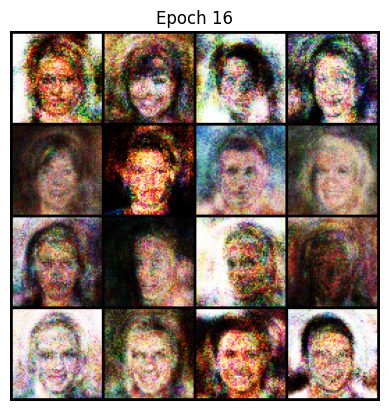

[Epoch 17/25] [Batch 0/1583] [D loss: 0.5372207760810852] [G loss: 1.1385248899459839]
[Epoch 17/25] [Batch 50/1583] [D loss: 0.5895963907241821] [G loss: 1.2769908905029297]
[Epoch 17/25] [Batch 100/1583] [D loss: 0.5929481387138367] [G loss: 0.9626786708831787]
[Epoch 17/25] [Batch 150/1583] [D loss: 0.5775001645088196] [G loss: 0.970240592956543]
[Epoch 17/25] [Batch 200/1583] [D loss: 0.5807839632034302] [G loss: 1.0730884075164795]
[Epoch 17/25] [Batch 250/1583] [D loss: 0.5671878457069397] [G loss: 1.0477790832519531]
[Epoch 17/25] [Batch 300/1583] [D loss: 0.5411959886550903] [G loss: 1.0365538597106934]
[Epoch 17/25] [Batch 350/1583] [D loss: 0.5746549367904663] [G loss: 1.0642144680023193]
[Epoch 17/25] [Batch 400/1583] [D loss: 0.6216535568237305] [G loss: 1.08951997756958]
[Epoch 17/25] [Batch 450/1583] [D loss: 0.6096974015235901] [G loss: 1.0527310371398926]
[Epoch 17/25] [Batch 500/1583] [D loss: 0.5978046655654907] [G loss: 1.0891845226287842]
[Epoch 17/25] [Batch 550/15

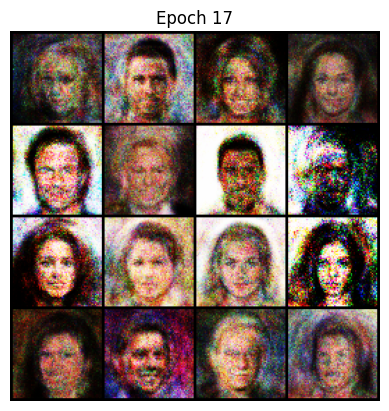

[Epoch 18/25] [Batch 0/1583] [D loss: 0.6125722527503967] [G loss: 1.1395034790039062]
[Epoch 18/25] [Batch 50/1583] [D loss: 0.5645389556884766] [G loss: 1.1031605005264282]
[Epoch 18/25] [Batch 100/1583] [D loss: 0.5548071265220642] [G loss: 1.0625678300857544]
[Epoch 18/25] [Batch 150/1583] [D loss: 0.5343464016914368] [G loss: 0.9425909519195557]
[Epoch 18/25] [Batch 200/1583] [D loss: 0.5255154371261597] [G loss: 1.0802574157714844]
[Epoch 18/25] [Batch 250/1583] [D loss: 0.5743699669837952] [G loss: 1.0666074752807617]
[Epoch 18/25] [Batch 300/1583] [D loss: 0.5502249002456665] [G loss: 0.9494702816009521]
[Epoch 18/25] [Batch 350/1583] [D loss: 0.6098438501358032] [G loss: 0.9663803577423096]
[Epoch 18/25] [Batch 400/1583] [D loss: 0.514629602432251] [G loss: 1.1786993741989136]
[Epoch 18/25] [Batch 450/1583] [D loss: 0.551970362663269] [G loss: 1.1716361045837402]
[Epoch 18/25] [Batch 500/1583] [D loss: 0.5116374492645264] [G loss: 1.2602388858795166]
[Epoch 18/25] [Batch 550/1

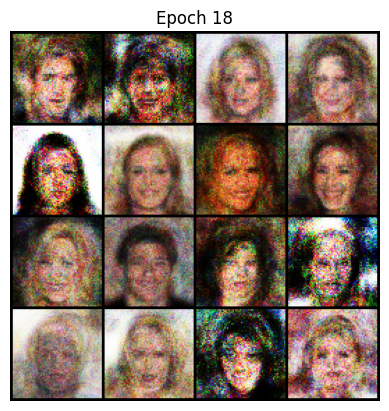

[Epoch 19/25] [Batch 0/1583] [D loss: 0.5482447147369385] [G loss: 1.1233470439910889]
[Epoch 19/25] [Batch 50/1583] [D loss: 0.5448271632194519] [G loss: 0.9919297695159912]
[Epoch 19/25] [Batch 100/1583] [D loss: 0.5601774454116821] [G loss: 0.9857761859893799]
[Epoch 19/25] [Batch 150/1583] [D loss: 0.5265892744064331] [G loss: 1.1178202629089355]
[Epoch 19/25] [Batch 200/1583] [D loss: 0.5600252151489258] [G loss: 1.0054296255111694]
[Epoch 19/25] [Batch 250/1583] [D loss: 0.609291672706604] [G loss: 1.1769503355026245]
[Epoch 19/25] [Batch 300/1583] [D loss: 0.6561921834945679] [G loss: 0.9798907041549683]
[Epoch 19/25] [Batch 350/1583] [D loss: 0.5462027788162231] [G loss: 1.22184419631958]
[Epoch 19/25] [Batch 400/1583] [D loss: 0.5943767428398132] [G loss: 0.9890411496162415]
[Epoch 19/25] [Batch 450/1583] [D loss: 0.5957387685775757] [G loss: 1.1915825605392456]
[Epoch 19/25] [Batch 500/1583] [D loss: 0.5914531350135803] [G loss: 1.0612213611602783]
[Epoch 19/25] [Batch 550/15

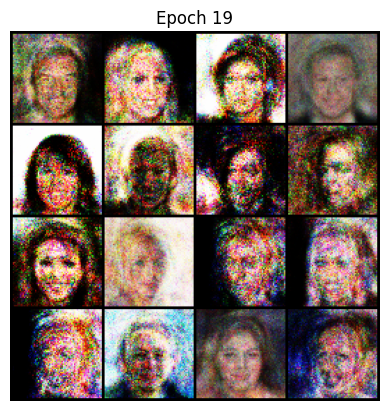

[Epoch 20/25] [Batch 0/1583] [D loss: 0.590678334236145] [G loss: 1.1174780130386353]
[Epoch 20/25] [Batch 50/1583] [D loss: 0.5940129160881042] [G loss: 1.0737199783325195]
[Epoch 20/25] [Batch 100/1583] [D loss: 0.5498653650283813] [G loss: 1.0831371545791626]
[Epoch 20/25] [Batch 150/1583] [D loss: 0.564214825630188] [G loss: 1.137043833732605]
[Epoch 20/25] [Batch 200/1583] [D loss: 0.5647040009498596] [G loss: 1.1066663265228271]
[Epoch 20/25] [Batch 250/1583] [D loss: 0.5865238308906555] [G loss: 1.1766437292099]
[Epoch 20/25] [Batch 300/1583] [D loss: 0.5956146717071533] [G loss: 1.221034288406372]
[Epoch 20/25] [Batch 350/1583] [D loss: 0.600501298904419] [G loss: 0.9922153353691101]
[Epoch 20/25] [Batch 400/1583] [D loss: 0.5924714803695679] [G loss: 1.002413034439087]
[Epoch 20/25] [Batch 450/1583] [D loss: 0.5409420728683472] [G loss: 1.0772448778152466]
[Epoch 20/25] [Batch 500/1583] [D loss: 0.6137610673904419] [G loss: 0.9865444898605347]
[Epoch 20/25] [Batch 550/1583] [D

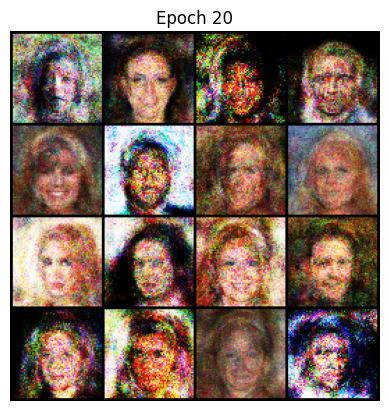

[Epoch 21/25] [Batch 0/1583] [D loss: 0.5692317485809326] [G loss: 1.0176211595535278]
[Epoch 21/25] [Batch 50/1583] [D loss: 0.5720635652542114] [G loss: 1.1651861667633057]
[Epoch 21/25] [Batch 100/1583] [D loss: 0.5722184181213379] [G loss: 1.032038688659668]
[Epoch 21/25] [Batch 150/1583] [D loss: 0.5069831609725952] [G loss: 1.0432343482971191]
[Epoch 21/25] [Batch 200/1583] [D loss: 0.5776684284210205] [G loss: 1.0119637250900269]
[Epoch 21/25] [Batch 250/1583] [D loss: 0.6129084825515747] [G loss: 1.1743769645690918]
[Epoch 21/25] [Batch 300/1583] [D loss: 0.6061111688613892] [G loss: 1.2043534517288208]
[Epoch 21/25] [Batch 350/1583] [D loss: 0.5977993011474609] [G loss: 1.0157111883163452]
[Epoch 21/25] [Batch 400/1583] [D loss: 0.5699111819267273] [G loss: 1.2064186334609985]
[Epoch 21/25] [Batch 450/1583] [D loss: 0.6023728251457214] [G loss: 0.9292752146720886]
[Epoch 21/25] [Batch 500/1583] [D loss: 0.588406503200531] [G loss: 1.0111864805221558]
[Epoch 21/25] [Batch 550/1

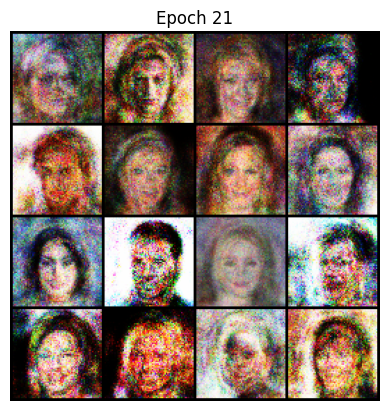

[Epoch 22/25] [Batch 0/1583] [D loss: 0.6173479557037354] [G loss: 1.1129310131072998]
[Epoch 22/25] [Batch 50/1583] [D loss: 0.5957583785057068] [G loss: 1.0756800174713135]
[Epoch 22/25] [Batch 100/1583] [D loss: 0.5749907493591309] [G loss: 1.1745765209197998]
[Epoch 22/25] [Batch 150/1583] [D loss: 0.5641463398933411] [G loss: 1.1899402141571045]
[Epoch 22/25] [Batch 200/1583] [D loss: 0.5466338396072388] [G loss: 1.044640064239502]
[Epoch 22/25] [Batch 250/1583] [D loss: 0.6216751337051392] [G loss: 0.9476851224899292]
[Epoch 22/25] [Batch 300/1583] [D loss: 0.6016116142272949] [G loss: 1.2632620334625244]
[Epoch 22/25] [Batch 350/1583] [D loss: 0.6666430234909058] [G loss: 1.0496548414230347]
[Epoch 22/25] [Batch 400/1583] [D loss: 0.5477191209793091] [G loss: 0.9659097790718079]
[Epoch 22/25] [Batch 450/1583] [D loss: 0.5820584893226624] [G loss: 1.0000956058502197]
[Epoch 22/25] [Batch 500/1583] [D loss: 0.5554336905479431] [G loss: 1.0884917974472046]
[Epoch 22/25] [Batch 550/

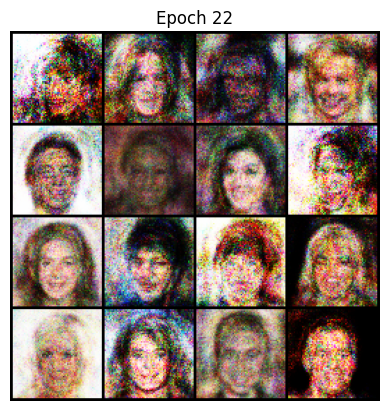

[Epoch 23/25] [Batch 0/1583] [D loss: 0.5531341433525085] [G loss: 0.9834204316139221]
[Epoch 23/25] [Batch 50/1583] [D loss: 0.5315373539924622] [G loss: 1.161865472793579]
[Epoch 23/25] [Batch 100/1583] [D loss: 0.5582901239395142] [G loss: 0.90521639585495]
[Epoch 23/25] [Batch 150/1583] [D loss: 0.6143659353256226] [G loss: 1.1640758514404297]
[Epoch 23/25] [Batch 200/1583] [D loss: 0.5918786525726318] [G loss: 1.1175453662872314]
[Epoch 23/25] [Batch 250/1583] [D loss: 0.6122486591339111] [G loss: 1.0629298686981201]
[Epoch 23/25] [Batch 300/1583] [D loss: 0.5645221471786499] [G loss: 1.0608519315719604]
[Epoch 23/25] [Batch 350/1583] [D loss: 0.6107261776924133] [G loss: 1.2570703029632568]
[Epoch 23/25] [Batch 400/1583] [D loss: 0.5860289931297302] [G loss: 1.1581581830978394]
[Epoch 23/25] [Batch 450/1583] [D loss: 0.5519156455993652] [G loss: 1.2166327238082886]
[Epoch 23/25] [Batch 500/1583] [D loss: 0.6020340919494629] [G loss: 1.2374615669250488]
[Epoch 23/25] [Batch 550/15

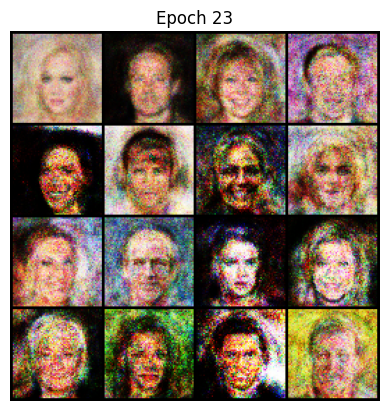

[Epoch 24/25] [Batch 0/1583] [D loss: 0.6003391742706299] [G loss: 1.0860097408294678]
[Epoch 24/25] [Batch 50/1583] [D loss: 0.5751124024391174] [G loss: 1.0603127479553223]
[Epoch 24/25] [Batch 100/1583] [D loss: 0.5513253211975098] [G loss: 1.1975998878479004]
[Epoch 24/25] [Batch 150/1583] [D loss: 0.6334139108657837] [G loss: 1.1613563299179077]
[Epoch 24/25] [Batch 200/1583] [D loss: 0.5714346766471863] [G loss: 1.197891116142273]
[Epoch 24/25] [Batch 250/1583] [D loss: 0.5886205434799194] [G loss: 1.1627836227416992]
[Epoch 24/25] [Batch 300/1583] [D loss: 0.567048966884613] [G loss: 1.090559959411621]
[Epoch 24/25] [Batch 350/1583] [D loss: 0.5869337320327759] [G loss: 1.2648128271102905]
[Epoch 24/25] [Batch 400/1583] [D loss: 0.5477993488311768] [G loss: 0.9549318552017212]
[Epoch 24/25] [Batch 450/1583] [D loss: 0.5777084231376648] [G loss: 1.0908868312835693]
[Epoch 24/25] [Batch 500/1583] [D loss: 0.6289918422698975] [G loss: 1.1188392639160156]
[Epoch 24/25] [Batch 550/15

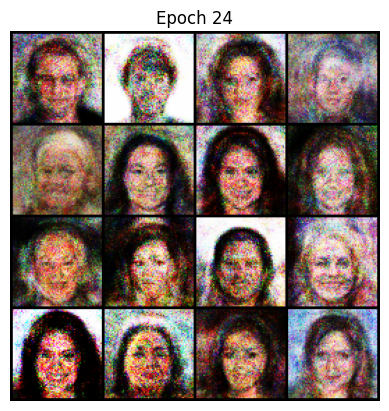

In [19]:
# Start training
train(generator, discriminator, dataloader, epochs=25)